The database I chose comes from Kaggle. Classification concerns the recognition of sports disciplines based on data in the form of images. The database contains 100 different categories of sports disciplines. The project was entirely created in the Google Colab environment.

The first stage of my work was to import data into Colab
. For this purpose, I used Google Drive, more specifically, it served as an intermediary for data transfer.

In [1]:
# Code to read csv file into colaboratory:
!pip install -U -q PyDrive
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

In [2]:
#STEP-2: Autheticate E-Mail ID
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [3]:
#2.1 Get the file
downloaded = drive.CreateFile({'id':'1oYEF9_u6RcWXslC-E-aB8F5iEkRhtkXb'})
downloaded.GetContentFile('archive.zip')

The data was imported, we will use the patoolib library to unpack

In [4]:
!pip install patool
import patoolib
patoolib.extract_archive("archive.zip")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 77.5/77.5 kB 2.2 MB/s eta 0:00:00
patool: Extracting archive.zip ...
patool: running /usr/bin/7z x -o./Unpack_8tmgnl7k -- archive.zip
patool: ... archive.zip extracted to `archive' (multiple files in root).


'archive'

After unpacking, we can see that the data is already divided into test, training and validation sets. There are two files csv sports and class_dict. Both files describe the data structure. Additionally, after unpacking, the EfficientNetB3 model appeared, which is a model probably trained by the author of the data set. The model reportedly achieves an efficiency of 97.8% on the validation set. Let's see if we can match it.

In [7]:
from matplotlib import pyplot
from matplotlib.image import imread
import os
from sklearn.preprocessing import LabelEncoder
import cv2
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout,MaxPool2D,Activation
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from keras.optimizers import SGD, Adamax
import tensorflow as tf
from tensorflow.keras import regularizers
from keras.layers import GlobalAveragePooling2D
import sys
from matplotlib import pyplot
from sklearn.metrics import confusion_matrix
!pip install efficientnet
import efficientnet.tfkeras as efn
from keras.layers import GlobalAveragePooling2D
from pathlib import Path
import pandas as pd
from sklearn.metrics import classification_report,accuracy_score

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 1.4 MB/s eta 0:00:00


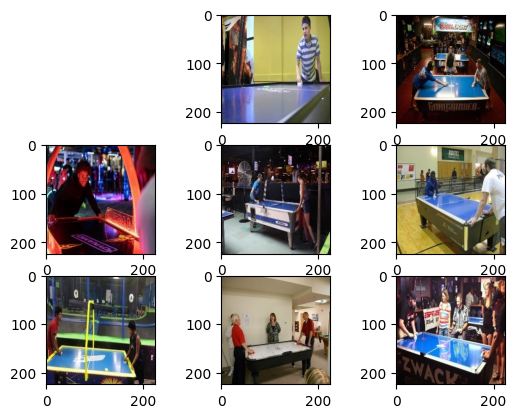

In [8]:
# define location of dataset

folder ='/content/archive/train/air hockey/'
for i in range(1,9):
  pyplot.subplot(330 + 1 + i)
  #define filename
  filename = folder + '00' + str(i) + '.jpg'
  #load image pixels
  image = imread(filename)
  # plot raw pixel data
  pyplot.imshow(image)
pyplot.show()

Unfortunately, the images are sorted by categories in folders and their names are only numbers. We need to modify and assign each image the name of the folder in which it is located.

In [9]:
folder = "/content/archive/train"
dir_list = os.listdir(folder)

for i in dir_list: # we iterate over every discipline name
  folder2=folder +'/' +str(i) # eneter every folder with a name of a discipline
  for count, filename in enumerate(os.listdir(folder2)):
     name = str(i) +'.'+ filename # target name of the file in folder
     src =folder2 +'/' +filename  # old name of the file in folder
     dst = folder2 + '/' + name #ne name of the file in folder
     # rename changes all old names to new
     os.rename(src, dst)

In [10]:
folder = "/content/archive/test"
dir_list = os.listdir(folder)

for i in dir_list:
  folder2=folder +'/' +str(i)
  for count, filename in enumerate(os.listdir(folder2)):
     name = str(i) +'.'+ filename
     src =folder2 +'/' +filename
     dst = folder2 + '/' + name
     os.rename(src, dst)

Now we will check if all images are the same size

In [11]:
folder = "/content/archive/train"
dir_list = os.listdir(folder)
lista=[]
for i in dir_list:
  folder2=folder +'/' +str(i)
  for filename in os.listdir(folder2):
    im = cv2.imread(f'{folder2}/{filename}')
    lista.append(im.shape)
set(lista) # In Python 'set' cannot contain duplicates which means that only one size should appear

{(224, 224, 3)}

In [12]:
folder = "/content/archive/test"
dir_list = os.listdir(folder)
lista=[]
for i in dir_list: # iteruje po wszystkich nazwach dyscyplin
  folder2=folder +'/' +str(i) # wchodze do każdego folderu z nazwą dyscypliny
  for filename in os.listdir(folder2):
    im = cv2.imread(f'{folder2}/{filename}')
    lista.append(im.shape)
set(lista)

{(224, 224, 3)}

In [13]:
# create data generator
datagen = ImageDataGenerator()

Now I will create data classes that train, test and validate on data that has not been transformed

In [14]:
train_it = datagen.flow_from_directory('/content/archive/train',class_mode='categorical', batch_size=64,target_size=(224, 224))
test_it = datagen.flow_from_directory('/content/archive/test',class_mode='categorical', batch_size=64,target_size=(224, 224))
valid_it = datagen.flow_from_directory('/content/archive/valid',class_mode='categorical', batch_size=64,target_size=(224, 224))

Found 13572 images belonging to 100 classes.
Found 500 images belonging to 100 classes.
Found 500 images belonging to 100 classes.


There are several methods you can use to transform photos. I will make some transformations to visualize them.

1) Adjusting the size of photos. In my database, all photos have the same size, but for the purposes of the project, I will still modify the size of the photos on the second set.

2) Normalization, we will make some changes in numerical values ​​in pixels, will be scaled to the range [0,1]

3) Conversion to grayscale, RGB will be converted from 3 channels to 1 channel.

4) augmentation, rotation and mirroring of photos.

In [15]:
datagen2 = ImageDataGenerator(

    horizontal_flip=True,
    rotation_range=50,
    )
      #change of brightness

batch_size=8
train_generator = datagen2.flow_from_directory(
    '/content/archive/train',
    target_size=(112,112),
    color_mode='grayscale',
    batch_size=batch_size,        # batch_size = 8
    class_mode='categorical',
    shuffle=True)

Found 13572 images belonging to 100 classes.


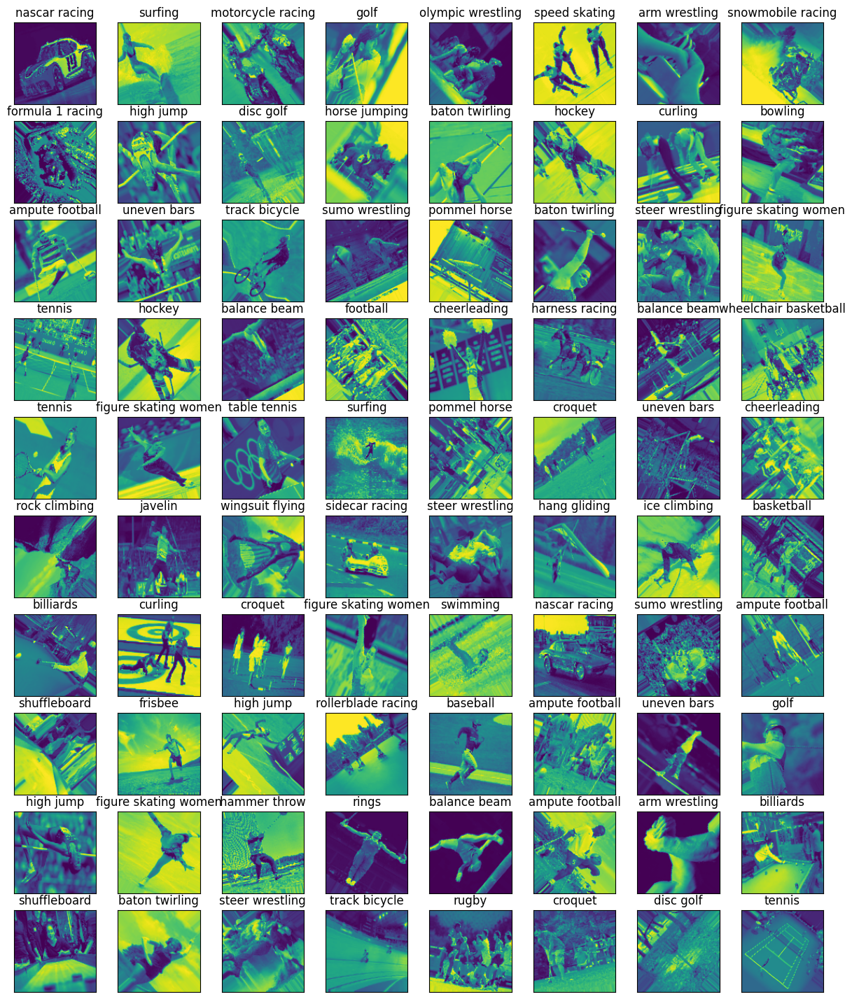

In [16]:
class_dictionary = train_generator.class_indices
#---create a dictionary of labels---
class_dictionary = { value:key for key,value in
    class_dictionary.items()}
#---convert the dictionary to a list---
class_list = [value for _,value in class_dictionary.items()]

rows = 10
fig, axes = plt.subplots(rows,batch_size)
for r in range(rows):
    #---get the batch of augmented images---
    image_batch = train_generator.next()
    #---get the number of images returned---
    images_count = image_batch[0].shape[0]

    for c in range(images_count):
        #---convert to unsigned integers for viewing---
        image = image_batch[0][c].astype('uint8')

        #---display the image---
        axes[r,c].imshow(image)
        #---display the label of the image---
        axes[r,c].title.set_text(
             class_list[np.argmax(image_batch[1][c])])
        #---hides the x and y-ticks---
        axes[r,c].set_xticks([])
        axes[r,c].set_yticks([])
fig.set_size_inches(15,18)

As we can see, after transforming the data, it is difficult to recognize some disciplines. On the other hand, the data size has been greatly reduced. Finally, I will use some other transformations to create the model.

Now I will move on to the stage of creating classifiers.
I'll start with convolutional networks.

First, I will create a model for the raw data.

In [17]:
# 13572/64=213

model = Sequential()
model.add(Conv2D(32, (3, 3), input_shape=(224, 224,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(100))
model.add(Activation('softmax'))

model.compile(optimizer='adam' , loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 activation (Activation)     (None, 222, 222, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2  (None, 111, 111, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      9248      
                                                                 
 activation_1 (Activation)   (None, 109, 109, 32)      0         
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 54, 54, 32)        0         
 g2D)                                                   

In [18]:
history = model.fit_generator(train_it, steps_per_epoch=213,validation_data=valid_it, epochs=20, verbose=1)

<ipython-input-18-a70385ea2663>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_it, steps_per_epoch=213,validation_data=valid_it, epochs=20, verbose=1)


Epoch 1/20
213/213 [==============================] - 52s 186ms/step - loss: 6.1610 - accuracy: 0.0129 - val_loss: 4.6055 - val_accuracy: 0.0100
Epoch 2/20
213/213 [==============================] - 39s 181ms/step - loss: 4.6009 - accuracy: 0.0141 - val_loss: 4.6061 - val_accuracy: 0.0100
Epoch 3/20
213/213 [==============================] - 36s 168ms/step - loss: 4.5987 - accuracy: 0.0139 - val_loss: 4.6071 - val_accuracy: 0.0100
Epoch 4/20
213/213 [==============================] - 33s 154ms/step - loss: 4.5971 - accuracy: 0.0136 - val_loss: 4.6082 - val_accuracy: 0.0100
Epoch 5/20
213/213 [==============================] - 34s 161ms/step - loss: 4.5958 - accuracy: 0.0141 - val_loss: 4.6092 - val_accuracy: 0.0100
Epoch 6/20
213/213 [==============================] - 38s 180ms/step - loss: 4.5950 - accuracy: 0.0141 - val_loss: 4.6103 - val_accuracy: 0.0100
Epoch 7/20
213/213 [==============================] - 38s 180ms/step - loss: 4.5944 - accuracy: 0.0141 - val_loss: 4.6112 - val_ac

In [ ]:
model.save('basic_model.h5')

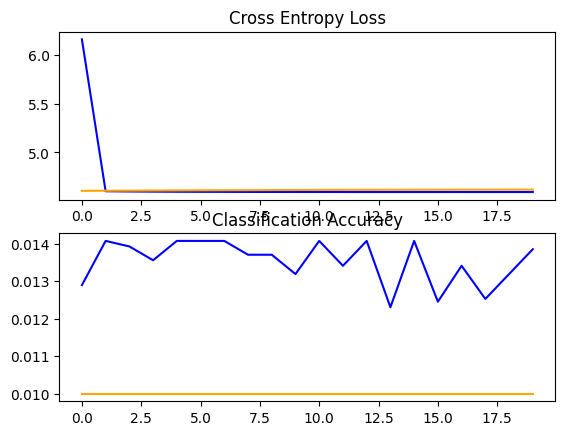

In [19]:
# plot diagnostic learning curves
def summarize_diagnostics(history):
    # plot loss
    pyplot.subplot(211)
    pyplot.title('Cross Entropy Loss')
    pyplot.plot(history.history['loss'], color='blue', label='train')
    pyplot.plot(history.history['val_loss'], color='orange', label='test')
    # plot accuracy
    pyplot.subplot(212)
    pyplot.title('Classification Accuracy')
    pyplot.plot(history.history['accuracy'], color='blue', label='train')
    pyplot.plot(history.history['val_accuracy'], color='orange', label='test')
    pyplot.show()
summarize_diagnostics(history)

As we can see from the graphs, the model didn't learn anything.

In [20]:
_, acc = model.evaluate_generator(test_it, steps=len(test_it), verbose=0)
print('> %.3f' % (acc * 100.0))

<ipython-input-20-efd8140b95ea>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  _, acc = model.evaluate_generator(test_it, steps=len(test_it), verbose=0)


> 1.000


Due to the terrible results of the regular model, I decided to use a pre-trained model. EfficientNetB0 is a covolutional network model that was trained on over a million images from the ImageNet dataset. The model has an input layer of dimensions 224x224.

First, I will test EfficientNetB0 on ​​a dataset without transformation.

In [21]:
base_model_efn=efn.EfficientNetB0(input_shape=(224,224,3),include_top=False,weights = 'imagenet')
for layer in base_model_efn.layers:
    layer.trainable = False

16804768/16804768 [==============================] - 0s 0us/step


In [22]:
train_it = datagen.flow_from_directory('/content/archive/train',
                                       class_mode='categorical',
                                       batch_size=512,
                                       target_size=(224, 224))

test_it = datagen.flow_from_directory('/content/archive/test',
                                      class_mode='categorical',
                                      batch_size=512,
                                      target_size=(224, 224))

valid_it = datagen.flow_from_directory('/content/archive/valid',
                                       class_mode='categorical',
                                       batch_size=512,
                                       target_size=(224, 224))

Found 13572 images belonging to 100 classes.
Found 500 images belonging to 100 classes.
Found 500 images belonging to 100 classes.


In [23]:
model_efn=Sequential()
model_efn.add(base_model_efn)
model_efn.add(GlobalAveragePooling2D())
model_efn.add(Dense(128))
model_efn.add(Dropout(0.2))
model_efn.add(Dense(100,activation='softmax'))
model_efn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b0 (Functiona  (None, 7, 7, 1280)        4049564   
 l)                                                              
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_2 (Dense)             (None, 128)               163968    
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 100)               12900     
                                                                 
Total params: 4226432 (16.12 MB)
Trainable params: 176

In [24]:
callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2)
model_efn.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [25]:
history_efn= model_efn.fit(train_it,validation_data=valid_it,epochs=10,callbacks=[callbacks],
                    verbose=1)

Epoch 1/10
27/27 [==============================] - 47s 1s/step - loss: 499.4949 - accuracy: 0.0084 - val_loss: 289.9794 - val_accuracy: 0.0120
Epoch 2/10
27/27 [==============================] - 41s 2s/step - loss: 369.6479 - accuracy: 0.0126 - val_loss: 249.2735 - val_accuracy: 0.0160
Epoch 3/10
27/27 [==============================] - 35s 1s/step - loss: 318.7256 - accuracy: 0.0139 - val_loss: 215.0077 - val_accuracy: 0.0140
Epoch 4/10
27/27 [==============================] - 34s 1s/step - loss: 275.0424 - accuracy: 0.0155 - val_loss: 201.9227 - val_accuracy: 0.0120
Epoch 5/10
27/27 [==============================] - 35s 1s/step - loss: 251.5239 - accuracy: 0.0170 - val_loss: 183.4092 - val_accuracy: 0.0120
Epoch 6/10
27/27 [==============================] - 33s 1s/step - loss: 233.4746 - accuracy: 0.0190 - val_loss: 177.3308 - val_accuracy: 0.0140
Epoch 7/10
27/27 [==============================] - 36s 1s/step - loss: 206.0933 - accuracy: 0.0177 - val_loss: 153.1317 - val_accuracy:

The results of the pre-trained model on raw data are just as poor. I think this is due to the fact that I did not perform even such basic activities as normalization of pixel values ​​on my raw data.

Now it's time for the transformed data.

In [26]:
train_datagen = ImageDataGenerator(
   rescale = 1./255.,
   rotation_range = 40,
   zoom_range = 0.2,
   horizontal_flip = True)
batch_size=512

train_generator = train_datagen.flow_from_directory('/content/archive/train',
                                                    target_size=(200,200),
                                                    batch_size=batch_size,
                                                    class_mode='categorical',
                                                    shuffle=True)

test_datagen = ImageDataGenerator(rescale = 1./255.)

test_gen = test_datagen.flow_from_directory('/content/archive/test',
                                            target_size = (200,200),
                                            class_mode = 'categorical',
                                            batch_size = 512, shuffle = False)

val_generator = train_datagen.flow_from_directory('/content/archive/train',
                                                  target_size=(200,200),
                                                  batch_size=batch_size,
                                                  class_mode='categorical',
                                                  shuffle=True)


Found 13572 images belonging to 100 classes.
Found 500 images belonging to 100 classes.
Found 13572 images belonging to 100 classes.


In [27]:
base_model_efn=efn.EfficientNetB0(input_shape=(200,200,3),include_top=False,weights = 'imagenet')
for layer in base_model_efn.layers:
    layer.trainable = False

In [28]:
model_efn=Sequential()
model_efn.add(base_model_efn)
model_efn.add(GlobalAveragePooling2D())
model_efn.add(Dense(128))
model_efn.add(Dropout(0.2))
model_efn.add(Dense(100,activation='softmax'))
model_efn.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 efficientnet-b0 (Functiona  (None, 7, 7, 1280)        4049564   
 l)                                                              
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_4 (Dense)             (None, 128)               163968    
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_5 (Dense)             (None, 100)               12900     
                                                                 
Total params: 4226432 (16.12 MB)
Trainable params: 176

In [29]:
callbacks=tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=2)
model_efn.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [30]:
history_mod_efn= model_efn.fit_generator(train_generator,validation_data=val_generator,epochs=10,verbose=1)

<ipython-input-30-336e70f830d5>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history_mod_efn= model_efn.fit_generator(train_generator,validation_data=val_generator,epochs=10,verbose=1)


Epoch 1/10
27/27 [==============================] - 352s 13s/step - loss: 3.7519 - accuracy: 0.1929 - val_loss: 2.6844 - val_accuracy: 0.4537
Epoch 2/10
27/27 [==============================] - 269s 10s/step - loss: 2.3320 - accuracy: 0.4701 - val_loss: 1.7199 - val_accuracy: 0.6161
Epoch 3/10
27/27 [==============================] - 269s 10s/step - loss: 1.7243 - accuracy: 0.5743 - val_loss: 1.3127 - val_accuracy: 0.6897
Epoch 4/10
27/27 [==============================] - 271s 10s/step - loss: 1.4339 - accuracy: 0.6298 - val_loss: 1.1052 - val_accuracy: 0.7329
Epoch 5/10
27/27 [==============================] - 271s 10s/step - loss: 1.2586 - accuracy: 0.6719 - val_loss: 0.9709 - val_accuracy: 0.7576
Epoch 6/10
27/27 [==============================] - 272s 10s/step - loss: 1.1448 - accuracy: 0.6975 - val_loss: 0.8810 - val_accuracy: 0.7790
Epoch 7/10
27/27 [==============================] - 269s 10s/step - loss: 1.0451 - accuracy: 0.7177 - val_loss: 0.8032 - val_accuracy: 0.7934
Epoch 

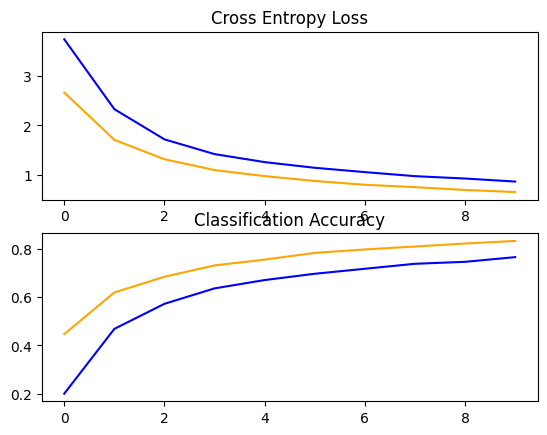

In [ ]:
# plot diagnostic learning curves
def summarize_diagnostics(history):
    # plot loss
    pyplot.subplot(211)
    pyplot.title('Cross Entropy Loss')
    pyplot.plot(history.history['loss'], color='blue', label='train')
    pyplot.plot(history.history['val_loss'], color='orange', label='test')
    # plot accuracy
    pyplot.subplot(212)
    pyplot.title('Classification Accuracy')
    pyplot.plot(history.history['accuracy'], color='blue', label='train')
    pyplot.plot(history.history['val_accuracy'], color='orange', label='test')
    # save plot to file
#     filename = sys.argv[0].split('/')[-1]
#     pyplot.savefig(filename + '_plot.png')
#     pyplot.close()
    pyplot.show()
summarize_diagnostics(history_mod_efn)

As we can see, the model in this case learned perfectly, it can be seen both in the validation and training set. A few more epochs could also improve the result a bit, judging by the charts.

After training for a long time, I decided to save the model with the intention of completing the analysis later.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
model_efn.save('model_efn.h5')

In [ ]:
model_efn_load = tf.keras.models.load_model('/content/model_efn.h5')

In [ ]:
model_efn_load.evaluate(test_gen)

1/1 [==============================] - 16s 16s/step - loss: 0.3904 - accuracy: 0.8940


[0.3903985023498535, 0.8939999938011169]

As we can see in the test set, the model achieved an efficiency of almost 90%.

In [ ]:
test_path = Path('/content/archive/test')
test_filepath = list(test_path.glob(r'**/*.jpg'))
classes_test = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],test_filepath))
test_df = pd.concat([pd.Series(test_filepath).astype(str), pd.Series(classes_test)], axis=1)
test_df.columns = ['Images', 'Image_label']

In [ ]:
test_gen = test_datagen.flow_from_dataframe(test_df,
                                            target_size = (200,200), x_col = 'Images', y_col ='Image_label',class_mode = 'categorical',
                                            batch_size = 512, shuffle = False)

Found 500 validated image filenames belonging to 100 classes.


Now we will visualize all the incorrect predictions on the test set. There are about 50 of them. The following bad predictions show that the network made errors mainly in difficult cases. For example confusing swimming with water polo or disc golf with frisbi

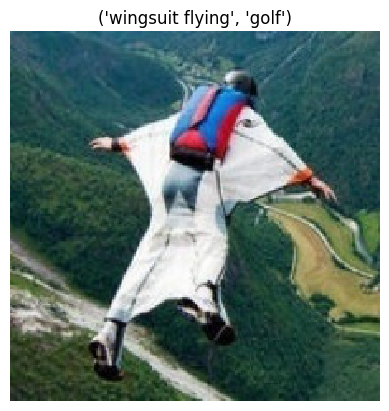

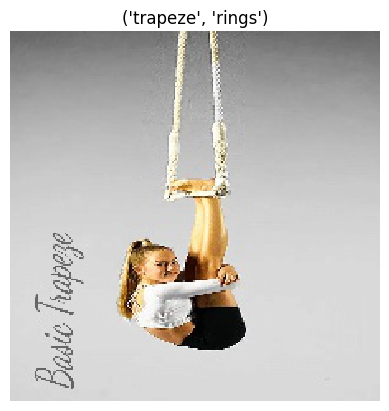

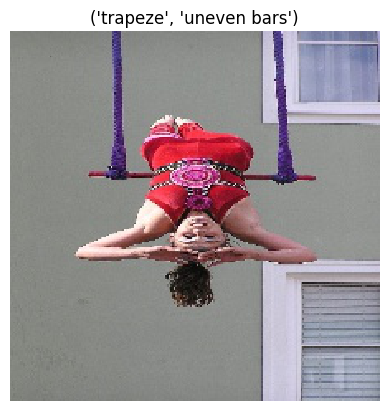

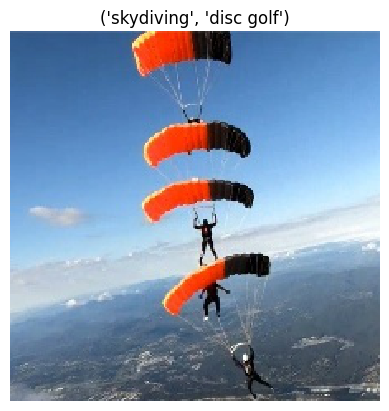

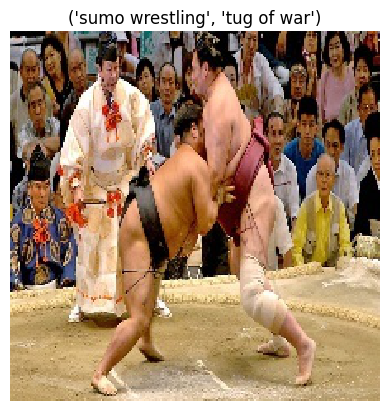

...

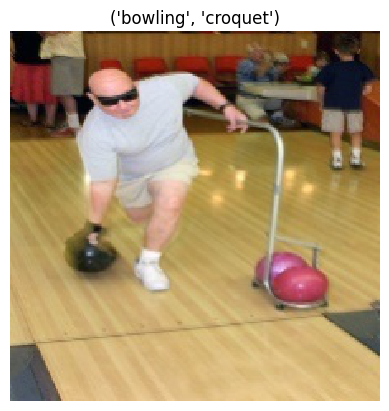

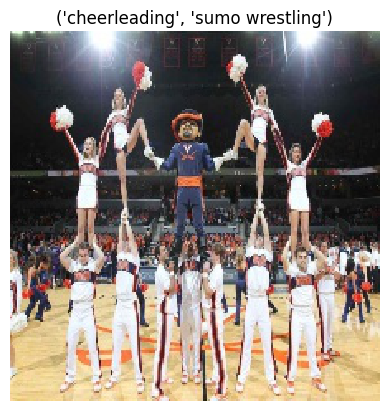

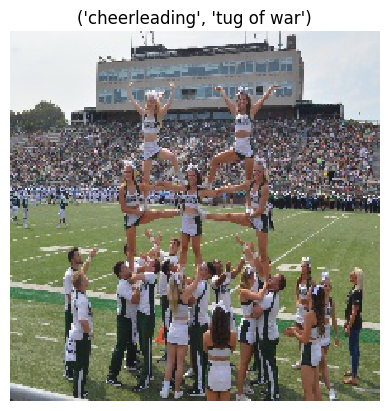

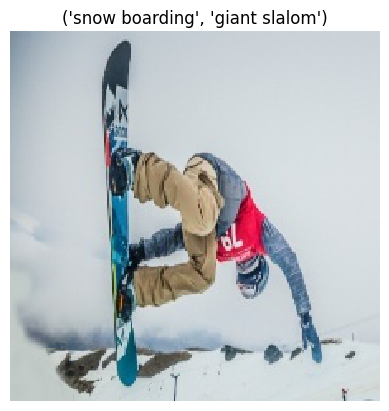

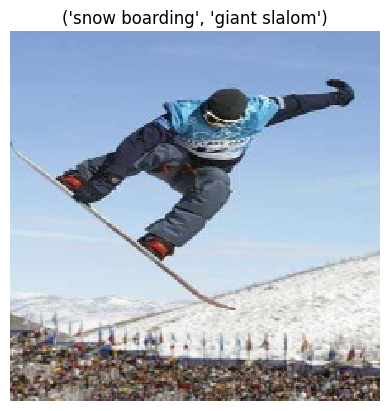

In [ ]:
from tensorflow.keras.utils import load_img,img_to_array

for i in range(len(test_df.Images)):
  foto=test_df.Images[i]
  # load the image
  img = load_img(foto, target_size=(200, 200))
      # convert to array
  img = img_to_array(img)/255
      # reshape into a single sample with 3 channels
  img = np.expand_dims(img, axis=0)
      # center pixel data
  img = img.astype('float32')
  predictions_efn= model_efn_load.predict(img,verbose=0)
  preds_efn=np.argmax(predictions_efn,axis=1)
  labels_efn=train_generator.class_indices
  labels_efn=dict((v,k) for k,v in labels_efn.items())
  preds_efn=[labels_efn[k] for k in preds_efn]
  if preds_efn[0] != test_df.Image_label[i]:
    image = imread(foto)
    # plot raw pixel data
    #fig.subplot(rows, columns, k,figsize=(10, 5))
    pyplot.imshow(image,interpolation='nearest' )
    pyplot.axis('off')
    pyplot.title(f"{test_df.Image_label[i],preds_efn[0]}")
    pyplot.show()

In [ ]:
predictions_efn= model_efn.predict(test_gen)
preds_efn=np.argmax(predictions_efn,axis=1)
labels_efn=train_gen.class_indices
labels_efn=dict((v,k) for k,v in labels_efn.items())
preds_efn=[labels_efn[k] for k in preds_efn]

Classification_report returns accuracy statistics for each category class.

In [ ]:
print(classification_report(test_df.Image_label,preds_efn))

                       precision    recall  f1-score   support

           air hockey       1.00      1.00      1.00         5
      ampute football       1.00      1.00      1.00         5
              archery       1.00      1.00      1.00         5
        arm wrestling       1.00      1.00      1.00         5
         axe throwing       1.00      1.00      1.00         5
         balance beam       1.00      1.00      1.00         5
        barell racing       1.00      1.00      1.00         5
             baseball       1.00      1.00      1.00         5
           basketball       1.00      0.80      0.89         5
       baton twirling       1.00      0.60      0.75         5
            bike polo       0.71      1.00      0.83         5
            billiards       1.00      1.00      1.00         5
                  bmx       1.00      0.40      0.57         5
              bobsled       1.00      0.80      0.89         5
              bowling       1.00      0.80      0.89  

Now I will start doing the classification for ordinary neural networks.

In [ ]:
model_nn = Sequential([Flatten(input_shape = [224, 224,3]),
Dense(300, activation = 'relu' ),
Dense(256, activation = 'relu' ),
Dense(256, activation = 'relu' ),
Dense(128, activation = 'relu' ),
Dense(100, activation = 'softmax' )])

In [ ]:
model_nn.compile(loss = 'categorical_crossentropy',
optimizer = 'sgd',
metrics = ['accuracy'])

First, I will create a model for the raw data.

In [ ]:
history_nn = model_nn.fit(train_it,
                    epochs = 10,
                    validation_data = valid_it,verbose=1)

Epoch 1/10
213/213 [==============================] - 155s 726ms/step - loss: nan - accuracy: 0.0083 - val_loss: nan - val_accuracy: 0.0100
Epoch 2/10
213/213 [==============================] - 135s 632ms/step - loss: nan - accuracy: 0.0083 - val_loss: nan - val_accuracy: 0.0100
Epoch 3/10
213/213 [==============================] - 129s 605ms/step - loss: nan - accuracy: 0.0083 - val_loss: nan - val_accuracy: 0.0100
Epoch 4/10
213/213 [==============================] - 132s 619ms/step - loss: nan - accuracy: 0.0083 - val_loss: nan - val_accuracy: 0.0100
Epoch 5/10
213/213 [==============================] - 130s 608ms/step - loss: nan - accuracy: 0.0083 - val_loss: nan - val_accuracy: 0.0100
Epoch 6/10
213/213 [==============================] - 132s 620ms/step - loss: nan - accuracy: 0.0083 - val_loss: nan - val_accuracy: 0.0100
Epoch 7/10
213/213 [==============================] - 166s 782ms/step - loss: nan - accuracy: 0.0083 - val_loss: nan - val_accuracy: 0.0100
Epoch 8/10
213/213 [

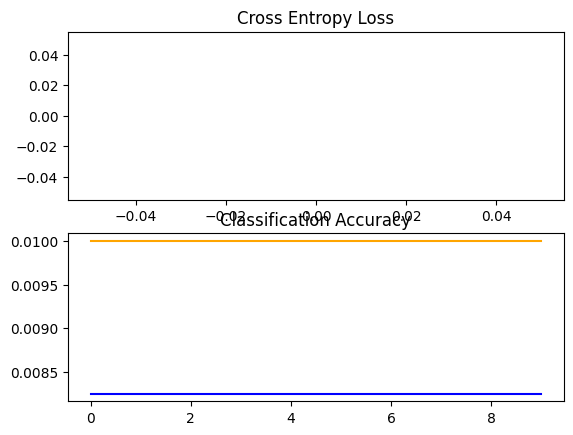

In [ ]:
def summarize_diagnostics(history):
    # plot loss
    pyplot.subplot(211)
    pyplot.title('Cross Entropy Loss')
    pyplot.plot(history.history['loss'], color='blue', label='train')
    pyplot.plot(history.history['val_loss'], color='orange', label='test')
    # plot accuracy
    pyplot.subplot(212)
    pyplot.title('Classification Accuracy')
    pyplot.plot(history.history['accuracy'], color='blue', label='train')
    pyplot.plot(history.history['val_accuracy'], color='orange', label='test')
    # save plot to file
#     filename = sys.argv[0].split('/')[-1]
#     pyplot.savefig(filename + '_plot.png')
#     pyplot.close()
    pyplot.show()
summarize_diagnostics(history_nn)

Just as it was the case with raw data for convolutional networks, the model did not learn anything.

Now the same neural network model for the data after transformation.

In [ ]:
model_nn = Sequential([Flatten(input_shape = [200, 200,3]),
Dense(300, activation = 'relu' ),
Dense(256, activation = 'relu' ),
Dense(256, activation = 'relu' ),
Dense(128, activation = 'relu' ),
Dense(100, activation = 'softmax' )])
model_nn.compile(loss = 'categorical_crossentropy',
optimizer = 'sgd',
metrics = ['accuracy'])


In [ ]:
history_nn = model_nn.fit(train_generator,
                    epochs = 10,
                    validation_data = val_generator,verbose=1)

Epoch 1/10
27/27 [==============================] - 289s 11s/step - loss: 4.5960 - accuracy: 0.0124 - val_loss: 4.5745 - val_accuracy: 0.0201
Epoch 2/10
27/27 [==============================] - 286s 11s/step - loss: 4.5627 - accuracy: 0.0146 - val_loss: 4.5594 - val_accuracy: 0.0108
Epoch 3/10
27/27 [==============================] - 275s 10s/step - loss: 4.5325 - accuracy: 0.0198 - val_loss: 4.5101 - val_accuracy: 0.0223
Epoch 4/10
27/27 [==============================] - 350s 13s/step - loss: 4.5023 - accuracy: 0.0247 - val_loss: 4.4699 - val_accuracy: 0.0284
Epoch 5/10
27/27 [==============================] - 378s 14s/step - loss: 4.4723 - accuracy: 0.0298 - val_loss: 4.4485 - val_accuracy: 0.0286
Epoch 6/10
27/27 [==============================] - 275s 10s/step - loss: 4.4422 - accuracy: 0.0352 - val_loss: 4.4171 - val_accuracy: 0.0371
Epoch 7/10
27/27 [==============================] - 276s 10s/step - loss: 4.4112 - accuracy: 0.0437 - val_loss: 4.3888 - val_accuracy: 0.0442
Epoch 

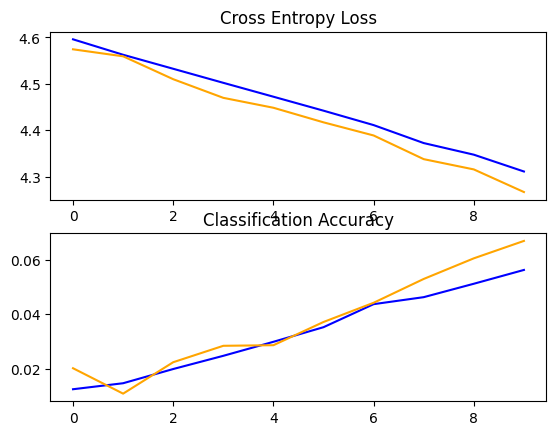

In [ ]:
summarize_diagnostics(history_nn)

In [ ]:
model_nn.evaluate(test_gen)

1/1 [==============================] - 1s 1s/step - loss: 4.2379 - accuracy: 0.0520


[4.237887859344482, 0.052000001072883606]

In [ ]:
model_nn.save('model_nn.h5')

In [ ]:
model_nn = tf.keras.models.load_model('/content/model_nn.h5')

In [ ]:
le = LabelEncoder()
lables = le.fit_transform(test_df.Image_label)

test_labels=test_gen.classes
predictions_nn= model_nn.predict(test_gen)
y_pred = np.argmax(predictions_nn, axis=-1)
print(classification_report(test_labels,y_pred,target_names=le.classes_))

1/1 [==============================] - 4s 4s/step
                       precision    recall  f1-score   support

           air hockey       0.00      0.00      0.00         5
      ampute football       0.00      0.00      0.00         5
              archery       0.00      0.00      0.00         5
        arm wrestling       0.00      0.00      0.00         5
         axe throwing       0.00      0.00      0.00         5
         balance beam       0.00      0.00      0.00         5
        barell racing       0.00      0.00      0.00         5
             baseball       0.00      0.00      0.00         5
           basketball       0.25      0.20      0.22         5
       baton twirling       0.00      0.00      0.00         5
            bike polo       0.00      0.00      0.00         5
            billiards       0.33      0.20      0.25         5
                  bmx       0.00      0.00      0.00         5
              bobsled       0.00      0.00      0.00         5
    

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Although the accuracy of 5% is still a poor result, the graphs show that a learning process took place here, unlike the previous model trained on unprocessed data. Perhaps a pre-made neural network model would do even better.

Now I will implement knn.

In [ ]:
train_path = Path('/content/archive/train')
train_filepath = list(train_path.glob(r'**/*.jpg'))
classes_train = list(map(lambda x: os.path.split(os.path.split(x)[0])[1],train_filepath))
train_df = pd.concat([pd.Series(train_filepath).astype(str), pd.Series(classes_train)], axis=1)
train_df.columns = ['Images', 'Image_label']

Now I will resize the images to the size of 28x28

In [ ]:
trainX=[]
trainY=[]
for image in train_df.Images:

    lable = os.path.split(os.path.split(image)[0])[1]
    trainY.append(lable)

    img = cv2.imread(image)
    img = cv2.resize(img, (28, 28), interpolation = cv2.INTER_AREA)
    trainX.append(img)


In [ ]:
testX=[]
testY=[]
for image in test_df.Images:

    lable = os.path.split(os.path.split(image)[0])[1]
    testY.append(lable)

    img = cv2.imread(image)
    img = cv2.resize(img, (28, 28), interpolation = cv2.INTER_AREA)
    testX.append(img)

In the case of knn, there is no training process, therefore the augmentation cannot be implemented correctly. I decided to fit the classifier to two types of data, first for unscaled pixel values.

In [ ]:
trainX = np.array(trainX)
trainY = np.array(trainY)

testX = np.array(testX)
testY = np.array(testY)

In [ ]:
dataset_size_1 = trainX.shape[0]
dataset_size_2 = testX.shape[0]

trainX = trainX.reshape(dataset_size_1,-1)
testX = testX.reshape(dataset_size_2,-1)

In [ ]:
le = LabelEncoder()
lables = le.fit_transform(testY)

n_jobs=-1 is a parameter that is intended to speed up calculations to find the nearest neighbor

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
model.fit(trainX, trainY)
knn= model.predict(testX)
print(classification_report(testY, knn, target_names=le.classes_))

                       precision    recall  f1-score   support

           air hockey       0.00      0.00      0.00         5
      ampute football       0.00      0.00      0.00         5
              archery       1.00      0.20      0.33         5
        arm wrestling       0.00      0.00      0.00         5
         axe throwing       0.14      0.20      0.17         5
         balance beam       0.20      0.40      0.27         5
        barell racing       0.67      0.40      0.50         5
             baseball       0.04      0.20      0.07         5
           basketball       0.00      0.00      0.00         5
       baton twirling       0.00      0.00      0.00         5
            bike polo       0.08      0.20      0.12         5
            billiards       0.67      0.40      0.50         5
                  bmx       0.00      0.00      0.00         5
              bobsled       0.17      0.20      0.18         5
              bowling       0.00      0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print(accuracy_score(testY, knn))

0.124


The KNN classifier is a primitive method, the classifier itself does not have a training stage. The accuracy of 12.4% puts it higher in the ranking than ordinary neural networks, which is quite surprising.

Now the knn classifier for data with scaled pixel value.

In [ ]:
trainX=[]
trainY=[]
for image in train_df.Images:

    lable = os.path.split(os.path.split(image)[0])[1]
    trainY.append(lable)

    img = cv2.imread(image)
    img = cv2.resize(img, (28, 28), interpolation = cv2.INTER_AREA)
    trainX.append(img)

In [ ]:
testX=[]
testY=[]
for image in test_df.Images:

    lable = os.path.split(os.path.split(image)[0])[1]
    testY.append(lable)

    img = cv2.imread(image)
    img = cv2.resize(img, (28, 28), interpolation = cv2.INTER_AREA)
    testX.append(img)

In [ ]:
trainX = np.array(trainX)/255
trainY = np.array(trainY)

testX = np.array(testX)/255
testY = np.array(testY)

In [ ]:
dataset_size_1 = trainX.shape[0]
dataset_size_2 = testX.shape[0]

trainX = trainX.reshape(dataset_size_1,-1)
testX = testX.reshape(dataset_size_2,-1)

In [ ]:
model = KNeighborsClassifier(n_neighbors=3, n_jobs=-1)
model.fit(trainX, trainY)
knn= model.predict(testX)

In [ ]:
print(accuracy_score(testY, knn))

0.124


In [ ]:
model = KNeighborsClassifier(n_neighbors=5, n_jobs=-1)
model.fit(trainX, trainY)
knn= model.predict(testX)
print(accuracy_score(testY, knn))

0.152


In [ ]:
model = KNeighborsClassifier(n_neighbors=7, n_jobs=-1)
model.fit(trainX, trainY)
knn= model.predict(testX)
print(accuracy_score(testY, knn))

0.168


In [ ]:
print(classification_report(testY, knn, target_names=le.classes_))

                       precision    recall  f1-score   support

           air hockey       0.00      0.00      0.00         5
      ampute football       0.00      0.00      0.00         5
              archery       0.00      0.00      0.00         5
        arm wrestling       0.00      0.00      0.00         5
         axe throwing       0.09      0.20      0.13         5
         balance beam       0.18      0.40      0.25         5
        barell racing       0.67      0.40      0.50         5
             baseball       0.00      0.00      0.00         5
           basketball       0.00      0.00      0.00         5
       baton twirling       0.00      0.00      0.00         5
            bike polo       0.00      0.00      0.00         5
            billiards       1.00      0.40      0.57         5
                  bmx       0.00      0.00      0.00         5
              bobsled       0.00      0.00      0.00         5
              bowling       0.00      0.00      0.00  

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


It turns out that rescaling the pixel values ​​did not give different results in the case of the knn classifier.

ummary of accuracy statistics (validation, testing and training averages) for classifiers:

Convolutional networks:
Hand-crafted topology, raw data: approximately 1%

EfficientNetB0, raw data: about 1.5%
EfficientNetB0, processed data: approximately 83% (test 89%)

Neural networks:
Hand-crafted topology, raw data: about 0.9%
Manually created topology, processed data: approximately 5.5%

K-Nearest neighbors:
3 neighbor model, raw data: 12.4%
3 neighbor model, rescaled pixel values: 12.4%

5 neighbor model, rescaled pixel values: 15.2%

model for 7 neighbors, rescaled pixel values: 16.8%

Summary,
Convolutional networks, and more specifically the ready-made EfficientNet model, were definitely the best in the project. A big surprise for me was the best accuracy achieved by knn, almost 17%. I didn't expect to get a double-digit result for this classifier. The weakest classifier in my project turned out to be neural networks. However, this is due to the fact that I did not use the appropriate structure to classify as many as 100 categories. Using a pre-trained model would increase the efficiency as was the case with convolutional networks.